## WEEKLY BRIEF
 Almost 30,000 Spotify songs from the Spotify API

![logo](spotify-logo.jpg)

### 1.What are the top 5 most popular artists?
###   Show a bar chart of the top 5 artists by average popularity

### 2.What genres are the top 5 most popular artists working in?
###   Show a pie chart showing the split of genres of tracks produced by the top 5 artist (25% pop, 40% EDM etc.)

### 3.For the top 1 most popular artist what's the genre split?
###   Show a plot showing average duration by year


### 4.Are songs getting shorter?
###   Show a plot showing average duration by year

Bonus
### 5.How has genres evolved over time?
###   Show a plot showing count of songs within a genre each year

### 6.What are the most danceable genres?
###   Show a bar chart the top 5 most danceable genres on average


#### **EDM is electronic dance music



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import plotly.express as px

spotify=pd.read_csv("spotify_songs.csv",parse_dates=["track_album_release_date"])

spotify.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32833 entries, 0 to 32832
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   track_id                  32833 non-null  object 
 1   track_name                32828 non-null  object 
 2   track_artist              32828 non-null  object 
 3   track_popularity          32833 non-null  int64  
 4   track_album_id            32833 non-null  object 
 5   track_album_name          32828 non-null  object 
 6   track_album_release_date  32833 non-null  object 
 7   playlist_name             32833 non-null  object 
 8   playlist_id               32833 non-null  object 
 9   playlist_genre            32833 non-null  object 
 10  playlist_subgenre         32833 non-null  object 
 11  danceability              32833 non-null  float64
 12  energy                    32833 non-null  float64
 13  key                       32833 non-null  int64  
 14  loudne

In [2]:
spotify.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,...,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


In [3]:
spotify.shape

(32833, 23)

In [4]:
spotify.describe()

,track_popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
count,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000,32833.000000
mean,42.477081,0.654850,0.698619,5.374471,-6.719499,0.565711,0.107068,0.175334,0.084747,0.190176,0.510561,120.881132,225799.811622
std,24.984074,0.145085,0.180910,3.611657,2.988436,0.495671,0.101314,0.219633,0.224230,0.154317,0.233146,26.903624,59834.006182
min,0.000000,0.000000,0.000175,0.000000,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000
25%,24.000000,0.563000,0.581000,2.000000,-8.171000,0.000000,0.041000,0.015100,0.000000,0.092700,0.331000,99.960000,187819.000000
50%,45.000000,0.672000,0.721000,6.000000,-6.166000,1.000000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,216000.000000
75%,62.000000,0.761000,0.840000,9.000000,-4.645000,1.000000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918000,253585.000000
max,100.000000,0.983000,1.000000,11.000000,1.275000,1.000000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,517810.000000


In [5]:
#checking presence of null values
spotify.isnull().sum()

track_id                    0
track_name                  5
track_artist                5
track_popularity            0
track_album_id              0
track_album_name            5
track_album_release_date    0
playlist_name               0
playlist_id                 0
playlist_genre              0
playlist_subgenre           0
danceability                0
energy                      0
key                         0
loudness                    0
mode                        0
speechiness                 0
acousticness                0
instrumentalness            0
liveness                    0
valence                     0
tempo                       0
duration_ms                 0
dtype: int64

## Find datasets startdate and enddate,also the duration in days and years

In [6]:
#use errors="coerce" handles inconsistent formats
spotify["track_album_release_date"]=pd.to_datetime(spotify["track_album_release_date"],errors="coerce")
min_date=spotify["track_album_release_date"].min()
max_date=spotify["track_album_release_date"].max()

print(f"First date of dataset is: {min_date}")
print(f"Last date of dataset is: {max_date}")
print(f"The duration of the dataset is: {max_date - min_date}")

First date of dataset is: 1957-01-01 00:00:00
Last date of dataset is: 2020-01-29 00:00:00
The duration of the dataset is: 23038 days 00:00:00


In [7]:
# Alternative extract year, month, and day

#spotify["year"] = pd.to_datetime(spotify["track_album_release_date"],errors="coerce").dt.year
# # spotify["month"] = spotify["track_album_release_date"].dt.month
# # spotify["day"] = spotify["track_album_release_dat"].dt.day

## What are the top 5 most popular artists?

In [8]:
top_5_artists = spotify.groupby("track_artist")["track_popularity"].mean().sort_values(ascending=False).head()

print(f"The Top5 most popular artists are:\n{top_5_artists}")


The Top5 most popular artists are:
track_artist
Trevor Daniel    97.000000
Y2K              91.000000
Don Toliver      90.714286
Roddy Ricch      88.210526
DaBaby           87.857143
Name: track_popularity, dtype: float64


## Visualize the wordcloud for artists name

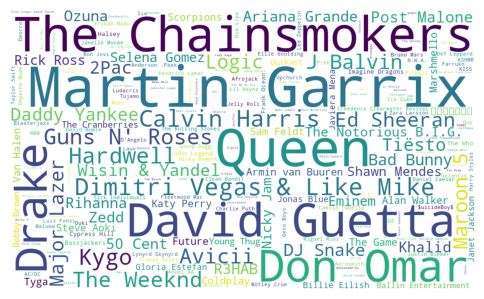

In [9]:
wordcloud=WordCloud(width=1000,height=600,background_color="white").generate_from_frequencies(spotify["track_artist"].value_counts())

plt.figure(figsize=(6,4))
plt.imshow(wordcloud)
plt.axis("off")
#plt.title("Word Cloud of Top 5 Popular Artists")
plt.show()

### The top5 least popular artists

In [10]:
least_5_artist=spotify.groupby("track_artist")["track_popularity"].mean().sort_values(ascending=False).tail()

print(f"The Top5 least popular artists are:\n{least_5_artist}")

The Top5 least popular artists are:
track_artist
Jeff Retro          0.0
Baby Doll           0.0
Wreckshop Family    0.0
Bacanos             0.0
Joe Bataan          0.0
Name: track_popularity, dtype: float64


## Show a bar chart of the top 5 artists by average popularity

    track_artist  track_popularity
0  Trevor Daniel         97.000000
1            Y2K         91.000000
2    Don Toliver         90.714286
3    Roddy Ricch         88.210526
4         DaBaby         87.857143


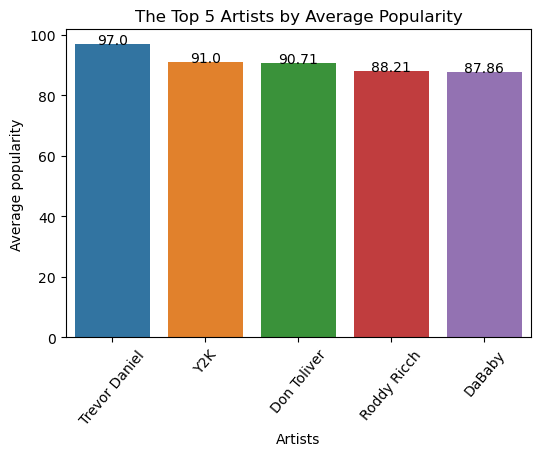

In [11]:

avg_popularity=top_5_artists.reset_index()

print(avg_popularity)

plt.figure(figsize=(6,4))
plot=sns.barplot(data=avg_popularity,x="track_artist",y="track_popularity")
plt.xlabel("Artists")
plt.ylabel("Average popularity")
plt.title("The Top 5 Artists by Average Popularity")
plt.xticks(rotation=50)

for index,value in enumerate(avg_popularity["track_popularity"]):
    plot.text(index,value, round(value,2),ha="center")

plt.show()


### What genres are the top 5 most popular artists working in?

In [12]:
top_5_art=top_5_artists.index.tolist()
top_5=spotify[spotify["track_artist"].isin(top_5_art)]
top5_genres_in_top5=top_5["playlist_genre"].value_counts()

top5_genres_in_top5

playlist_genre
rap      24
r&b      13
latin     7
edm       6
pop       3
Name: count, dtype: int64

### Show a pie chart showing the split of genres of tracks produced by the top 5 artist (25% pop, 40% EDM etc.)

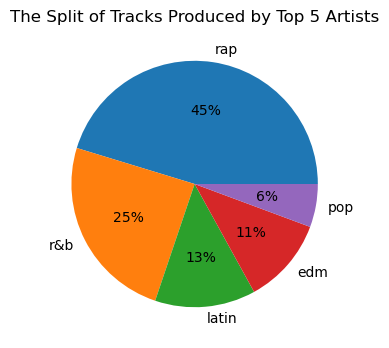

In [13]:
plt.figure(figsize=(4, 4))
plt.pie(top5_genres_in_top5, labels=top5_genres_in_top5.index, autopct="%.0f%%")
plt.title("The Split of Tracks Produced by Top 5 Artists")
plt.show()


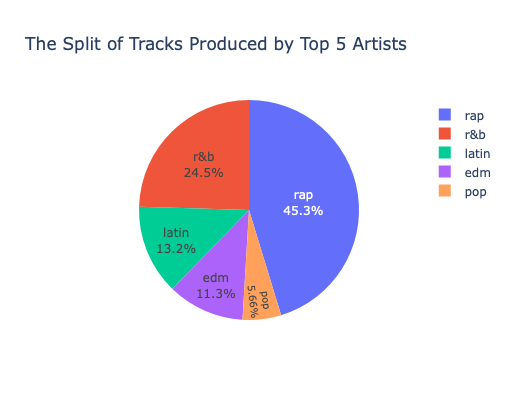

In [14]:

fig = px.pie(values=top5_genres_in_top5, names=top5_genres_in_top5.index, title="The Split of Tracks Produced by Top 5 Artists", labels=top5_genres_in_top5.index)
fig.update_traces(textposition="inside", textinfo="percent+label") 
fig.update_layout(width=500,height=400)
fig.show()

## For the top 1 most popular artist what's the genre split?

In [15]:

top1_artist=avg_popularity.head(1)
top1_artist

top1_genre_split=spotify[spotify["track_artist"]=="Trevor Daniel"]["playlist_genre"].value_counts()
top1_genre_split

playlist_genre
latin    2
pop      1
rap      1
r&b      1
edm      1
Name: count, dtype: int64

In [16]:
#if not hardcoding
top1_artist=avg_popularity.head(1)

top1_genre_split=spotify[spotify["track_artist"]==top1_artist["track_artist"].iloc[0]]["playlist_genre"].value_counts()
top1_genre_split

playlist_genre
latin    2
pop      1
rap      1
r&b      1
edm      1
Name: count, dtype: int64

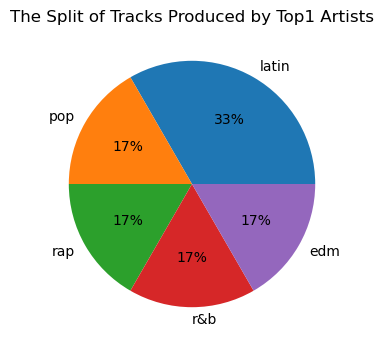

In [17]:
plt.figure(figsize=(4, 4))
plt.pie(top1_genre_split, labels=top1_genre_split.index, autopct="%1.0f%%")
plt.title("The Split of Tracks Produced by Top1 Artists")
plt.show()

## Show a plot showing average duration by year

In [18]:
# convert duration in milliseconds to seconds,and to minutes
# thousands of seconds is milliseconds

spotify["duration_sec"]=spotify["duration_ms"]/1000
spotify["duration_min"]=spotify["duration_ms"]/60000

print(spotify[["duration_ms","duration_sec","duration_min"]].tail())

       duration_ms  duration_sec  duration_min
32828       204375       204.375      3.406250
32829       353120       353.120      5.885333
32830       210112       210.112      3.501867
32831       367432       367.432      6.123867
32832       337500       337.500      5.625000


year
1957    2.670450
1958    2.441333
1961    3.312667
1963    4.072221
1964    2.452277
          ...   
2016    3.688423
2017    3.641185
2018    3.435472
2019    3.297309
2020    3.268089
Name: duration_min, Length: 61, dtype: float64


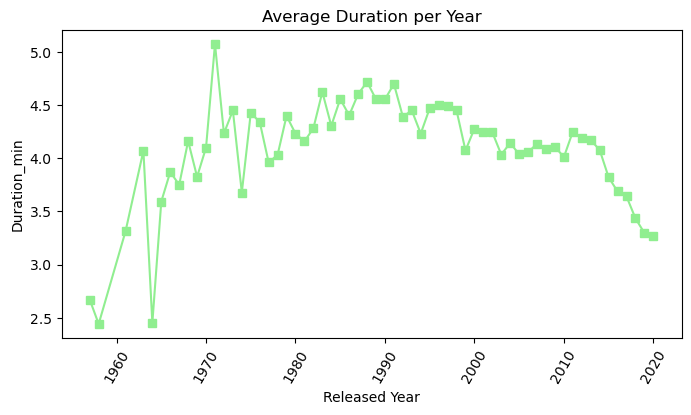

In [19]:
#spotify["year"]=spotify["track_album_release_date"].str[:4]
#if date is already datetime form
#without astype("Int64") column will treat as float coz of NaT values in date
spotify["year"]=spotify["track_album_release_date"].dt.year.astype("Int64")

avg_duration_per_year=spotify.groupby("year")["duration_min"].mean()
print(avg_duration_per_year)


plt.figure(figsize=(8,4))
avg_duration_per_year.plot(marker='s',color="lightgreen")
plt.xlabel("Released Year")
plt.ylabel("Duration_min")
plt.title("Average Duration per Year")
plt.xticks(rotation=60)
plt.show()

## Are songs getting shorter?

In [20]:
# average duration across all years

avg_duration_min=spotify["duration_min"].mean()

avg_duration_last_5_yrs=avg_duration_per_year[avg_duration_per_year.index[-5:]].mean()

print(f"Average duration across all years is: {avg_duration_min:.3} minutes.")
print(f"Average duration for the recent 5 years: {avg_duration_last_5_yrs:.3} minutes.")

if avg_duration_last_5_yrs > avg_duration_min:
    print("No,songs are not getting shorter.")
else:
    print("Yes,songs are getting shorter.")


Average duration across all years is: 3.76 minutes.
Average duration for the recent 5 years: 3.47 minutes.
Yes,songs are getting shorter.


## Show a plot showing average duration by year

## How has genres evolved over time?

In [21]:
distinct_genre=spotify["playlist_genre"].unique()
sum_distinct=len(distinct_genre)

print(f"There are {sum_distinct} different genres in playlists:\n {distinct_genre} \n")


distinct_subgenre=spotify["playlist_subgenre"].unique()
sum_subdistinct=len(distinct_subgenre)

print(f"There are {sum_subdistinct} different genres in playlists:\n {distinct_subgenre} ")

There are 6 different genres in playlists:
 ['pop' 'rap' 'rock' 'latin' 'r&b' 'edm'] 

There are 24 different genres in playlists:
 ['dance pop' 'post-teen pop' 'electropop' 'indie poptimism' 'hip hop'
 'southern hip hop' 'gangster rap' 'trap' 'album rock' 'classic rock'
 'permanent wave' 'hard rock' 'tropical' 'latin pop' 'reggaeton'
 'latin hip hop' 'urban contemporary' 'hip pop' 'new jack swing'
 'neo soul' 'electro house' 'big room' 'pop edm'
 'progressive electro house'] 


In [22]:
import plotly.express as px

spotify[['playlist_genre', 'playlist_subgenre']] = spotify[['playlist_genre', 'playlist_subgenre']].apply(lambda x: x.str.capitalize(), axis=1)
fig = px.sunburst(spotify,
                  path=['playlist_genre', 'playlist_subgenre'], 
                  color='track_popularity', 
                  labels={'track_popularity': 'Popularity'})
fig.update_layout(width=600,height=600)
fig.show()

### * By looking at the proportion of playlists' structure of genre and subgenre, we get to see most popular palylists genre are Pop and Latin,top 2 popular subgenre for Pop are Dance Pop and Post-teen pop, and top 2 popular subgenre for Latin are Latin pop and Reggaeton.

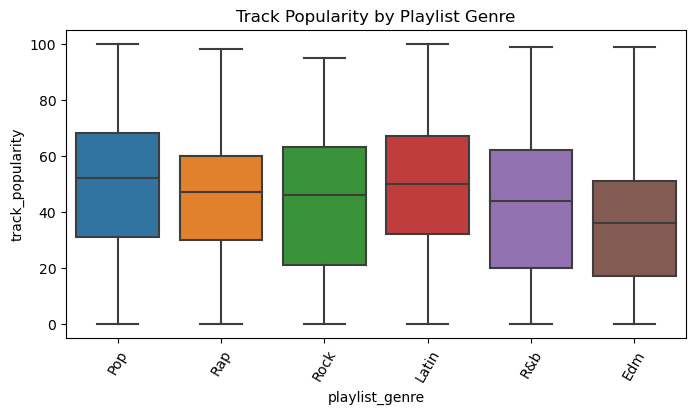

In [23]:
plt.figure(figsize=(8, 4))
sns.boxplot(x="playlist_genre", y="track_popularity", data=spotify)
plt.title("Track Popularity by Playlist Genre")
plt.xticks(rotation=60)
plt.show()

In [24]:
# in px
fig = px.box(spotify, x="playlist_genre", y="track_popularity", title="Track Popularity by Playlist Genre")
fig.update_layout(xaxis_title="Playlist Genre", yaxis_title="Track Popularity")
fig.update_xaxes(tickangle=60)  
fig.show()


### * From distribution of track_popularity of different genre,shows the innerquatile range of popularity values.

## Distribution of songs by each genre

In [25]:
genre_counts = spotify["playlist_genre"].value_counts()
fig= px.bar(x = genre_counts.index,
             y = genre_counts.values,
             color = genre_counts.index,
             text = genre_counts.values,
             title = "Distribution of songs by genres")
fig.update_layout(xaxis_title = "Genres",yaxis_title = "Count of songs")
fig.update_traces(width=0.4)
fig.show()

### *Edm(electronic dance music) has more songs amoung all playlists.

#### The numer of songs for each genre cross each year

In [26]:
genre_over_time=spotify.groupby(["year","playlist_genre"]).size().reset_index(name="count")

print(genre_over_time)

pivot_genre_by_year=genre_over_time.pivot_table(index="year",columns="playlist_genre",values="count",fill_value=0)

print(pivot_genre_by_year)

     year playlist_genre  count
0    1957            R&b      1
1    1958           Rock      1
2    1961            R&b      1
3    1963           Rock      4
4    1964           Rock      8
..    ...            ...    ...
268  2020          Latin    131
269  2020            Pop    170
270  2020            R&b     93
271  2020            Rap    159
272  2020           Rock     48

[273 rows x 3 columns]
playlist_genre   Edm  Latin   Pop   R&b   Rap  Rock
year                                               
1957               0      0     0     1     0     0
1958               0      0     0     0     0     1
1961               0      0     0     1     0     0
1963               0      0     0     0     0     4
1964               0      0     0     0     0     8
...              ...    ...   ...   ...   ...   ...
2016             496    372   527   349   293    77
2017             485    395   504   464   462   116
2018             755    567   704   452   705   129
2019            2321

<Figure size 1200x600 with 0 Axes>

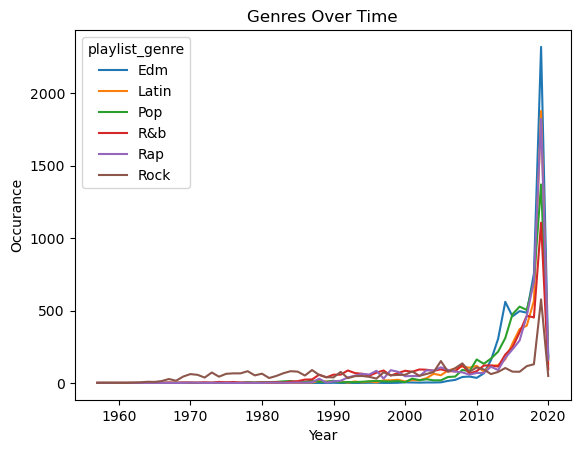

In [27]:
plt.figure(figsize=(12,6))
pivot_genre_by_year.plot(kind="line")
plt.xlabel("Year")
plt.ylabel("Occurance")
plt.title("Genres Over Time")
plt.show()

In [28]:
pivot_genre_reset = pivot_genre_by_year.reset_index()

fig = px.line(pivot_genre_reset, x='year', y=pivot_genre_reset.columns[1:],
              title='Count of Songs in Different Genres Over Time',
              labels={'value': 'Count', 'year': 'Year', 'playlist_genre': 'Genre'})
fig.update_layout(xaxis_title='Year', yaxis_title='Count')
fig.show()

## Zooming in data between 2010 and 2020

playlist_genre   Edm  Latin   Pop   R&b   Rap  Rock
year                                               
2010              35    118   162    81    69   107
2011              66     78   132   120    69    93
2012             157    118   168   121   112    61
2013             305    122   216   113    89    76
2014             560    163   310   196   173   103
2015             460    272   474   246   231    78
2016             496    372   527   349   293    77
2017             485    395   504   464   462   116
2018             755    567   704   452   705   129
2019            2321   1879  1371  1107  1824   577
2020             184    131   170    93   159    48


<Figure size 1200x600 with 0 Axes>

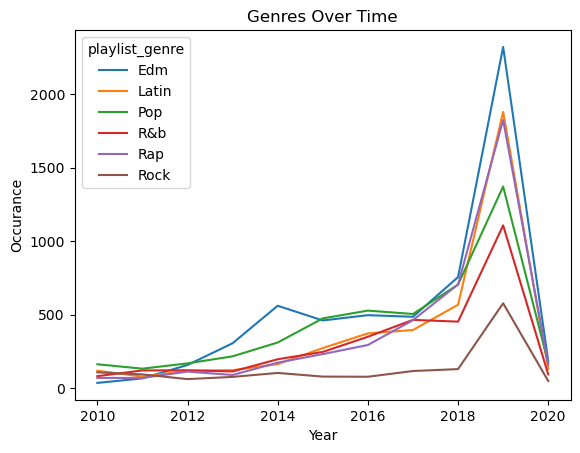

In [29]:
after2010=pivot_genre_by_year[pivot_genre_by_year.index>=2010]

print(after2010)

plt.figure(figsize=(12,6))
after2010.plot(kind="line")
plt.xlabel("Year")
plt.ylabel("Occurance")
plt.title("Genres Over Time")
plt.show()

In [32]:
unique_genres = genre_over_time['playlist_genre'].unique()

fig = px.bar(genre_over_time,
             y="playlist_genre",
             x="count",
             animation_frame="year",
             orientation='h',
             color="count")

fig.update_layout(
    width=800,
    height=500,
    yaxis=dict(range=[-1,6],categoryorder='array',categoryarray=unique_genres),
    title='Evolution of Genres',
    showlegend=True
)

fig.show()

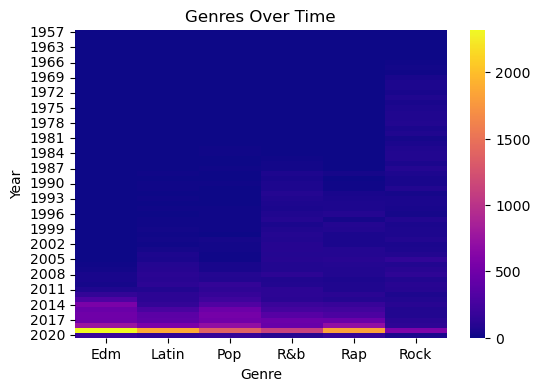

In [36]:
plt.figure(figsize=(6,4))
sns.heatmap(pivot_genre_by_year,cmap="plasma")
plt.xlabel("Genre")
plt.ylabel("Year")
plt.title("Genres Over Time")
plt.show()

In [37]:
fig = px.imshow(pivot_genre_by_year, 
                labels=dict(x="Genre", y="Year", color="Count"), 
                x=pivot_genre_by_year.columns, 
                y=pivot_genre_by_year.index,
                color_continuous_scale='plasma',
                title="Genres Over Time")
fig.update_xaxes(side="top") 
fig.show()

## Show a plot showing count of songs within a genre each year


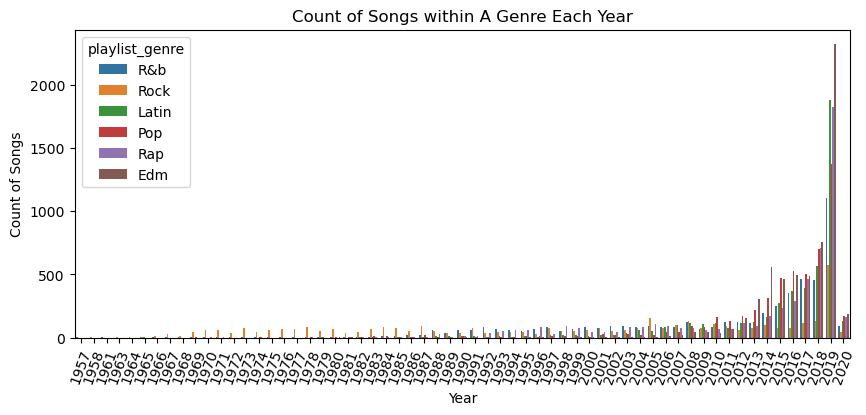

In [38]:

year_sorted = spotify.dropna(subset=['year', 'playlist_genre']).sort_values("year")

plt.figure(figsize=(10,4))
sns.countplot(data=year_sorted, x="year", hue="playlist_genre")
plt.xlabel("Year")
plt.ylabel("Count of Songs")
plt.title("Count of Songs within A Genre Each Year")
plt.xticks(rotation=70)
plt.show()


In [39]:

fig = px.histogram(year_sorted, x="year", color="playlist_genre",
                   title='Count of Songs within A Genre Each Year',
                   labels={'year': 'Year', 'count': 'Count of Songs', 'playlist_genre': 'Genre'})
fig.update_layout(xaxis={'title': 'Year'}, yaxis={'title': 'Count of Songs'})
fig.update_traces(marker_line_width=0.5, opacity=0.7) 
fig.show()


## What are the most danceable genres?

In [40]:
most_danceable_genres=spotify.groupby("playlist_genre")["danceability"].mean().sort_values(ascending=False).head(6)

most_danceable_genres

playlist_genre
Rap      0.718353
Latin    0.713287
R&b      0.670179
Edm      0.655041
Pop      0.639302
Rock     0.520548
Name: danceability, dtype: float64






## Show a bar chart the top 5 most danceable genres on average

In [41]:
# plt.figure(figsize=(10,4))
# sns.barplot(y=most_danceable_genres.index,x=most_danceable_genres.values,palette="viridis")
# plt.xlabel("Genres")
# plt.ylabel("Average Danceability")
# plt.title("Top 5 most danceable genres on Average")
# plt.xticks(rotation=50)
# plt.show()

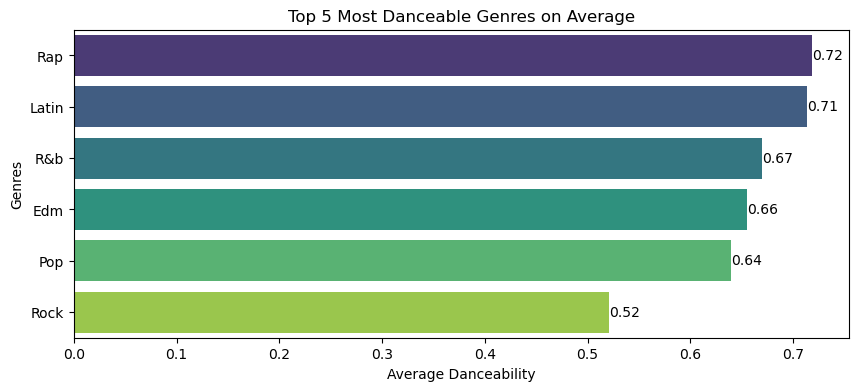

In [42]:
# Adding annotation to each bar

plt.figure(figsize=(10, 4))
plot = sns.barplot(y=most_danceable_genres.index, x=most_danceable_genres.values, palette="viridis")

for index, value in enumerate(most_danceable_genres.values):
    plot.text(value, index, f"{value:.2f}", va="center")

plt.xlabel("Average Danceability")
plt.ylabel("Genres")
plt.title("Top 5 Most Danceable Genres on Average")
plt.show()


In [43]:
top10_genres = spotify.nlargest(10, 'track_popularity')

fig = px.bar(top10_genres, 
             x='playlist_subgenre', 
             y=['valence', 'energy', 'danceability', 'acousticness'], 
             barmode='group')
fig.show()

In [44]:
top_10_songs=spotify.groupby("track_album_name")["track_popularity"].mean().sort_values(ascending=False).head(10)

top_10_songs

track_album_name
Dance Monkey (Stripped Back) / Dance Monkey    100.000000
Tusa                                            98.000000
everything i wanted                             97.000000
Don't Start Now                                 97.000000
Yummy                                           95.000000
Blinding Lights                                 94.333333
HIGHEST IN THE ROOM                             94.000000
Ride It                                         94.000000
hot girl bummer                                 94.000000
China                                           93.000000
Name: track_popularity, dtype: float64

In [45]:
top_10_songs=spotify.nlargest(10,"track_popularity")
top_10_songs

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,duration_sec,duration_min,year
1551,2XU0oxnq2qxCpomAAuJY8K,Dance Monkey,Tones and I,100,0UywfDKYlyiu1b38DRrzYD,Dance Monkey (Stripped Back) / Dance Monkey,2019-10-17,"post-teen alternative, indie, pop (large variety)",1y42gwI5cuwjBslPyQNfqb,Pop,...,0.0924,0.69200,0.000104,0.1490,0.513,98.027,209438,209.438,3.490633,2019
20091,2XU0oxnq2qxCpomAAuJY8K,Dance Monkey,Tones and I,100,0UywfDKYlyiu1b38DRrzYD,Dance Monkey (Stripped Back) / Dance Monkey,2019-10-17,Global Top 50 | 2020 Hits,1KNl4AYfgZtOVm9KHkhPTF,Latin,...,0.0924,0.69200,0.000104,0.1490,0.513,98.027,209438,209.438,3.490633,2019
20092,696DnlkuDOXcMAnKlTgXXK,ROXANNE,Arizona Zervas,99,6HJDrXs0hpebaRFKA1sF90,ROXANNE,2019-10-10,Global Top 50 | 2020 Hits,1KNl4AYfgZtOVm9KHkhPTF,Latin,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,163.636,2.727267,2019
21468,696DnlkuDOXcMAnKlTgXXK,ROXANNE,Arizona Zervas,99,6HJDrXs0hpebaRFKA1sF90,ROXANNE,2019-10-10,Contemporary Urban,6wyJ4bsjZaUKa9f6GeZlAO,R&b,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,163.636,2.727267,2019
23104,696DnlkuDOXcMAnKlTgXXK,ROXANNE,Arizona Zervas,99,6HJDrXs0hpebaRFKA1sF90,ROXANNE,2019-10-10,Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Po...,3xMQTDLOIGvj3lWH5e5x6F,R&b,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,163.636,2.727267,2019
30202,696DnlkuDOXcMAnKlTgXXK,ROXANNE,Arizona Zervas,99,6HJDrXs0hpebaRFKA1sF90,ROXANNE,2019-10-10,Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Po...,3xMQTDLOIGvj3lWH5e5x6F,Edm,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,163.636,2.727267,2019
687,7k4t7uLgtOxPwTpFmtJNTY,Tusa,KAROL G,98,7mKevNHhVnZER3BLgI8O4F,Tusa,2019-11-07,Todo Éxitos,2ji5tRQVfnhaX1w9FhmSzk,Pop,...,0.2980,0.29500,0.000134,0.0574,0.574,101.085,200960,200.960,3.349333,2019
711,2b8fOow8UzyDFAE27YhOZM,Memories,Maroon 5,98,3nR9B40hYLKLcR0Eph3Goc,Memories,2019-09-20,Todo Éxitos,2ji5tRQVfnhaX1w9FhmSzk,Pop,...,0.0546,0.83700,0.000000,0.0822,0.575,91.019,189486,189.486,3.158100,2019
716,0sf12qNH5qcw8qpgymFOqD,Blinding Lights,The Weeknd,98,2ZfHkwHuoAZrlz7RMj0PDz,Blinding Lights,2019-11-29,Todo Éxitos,2ji5tRQVfnhaX1w9FhmSzk,Pop,...,0.0629,0.00147,0.000209,0.0938,0.345,171.017,201573,201.573,3.359550,2019
1300,2b8fOow8UzyDFAE27YhOZM,Memories,Maroon 5,98,3nR9B40hYLKLcR0Eph3Goc,Memories,2019-09-20,Pop - Pop UK - 2019 - Canadian Pop - 2019 - Pop,46Cl6dmeiylK6TRGXr7hHe,Pop,...,0.0546,0.83700,0.000000,0.0822,0.575,91.019,189486,189.486,3.158100,2019


In [46]:
fig = px.bar(top_10_songs,x="track_album_name", y="track_popularity",width=800, height=500,
             labels={'track_album_name': 'Alblum Name', 'track_popularity': 'Average Popularity'},
             title='The Top 10 Songs by Average Popularity')
fig.show()

## A quick overview of how all numeric columns in spotify dataset are correlated with each other.
#### A higher positive correlation between loudness and energy，it's strong associated than other.
#### A strong negative correlation between acousticness and energy, so one increase the other one decrease, a higher values of acousticness might be associated with lower values of energy in songs.

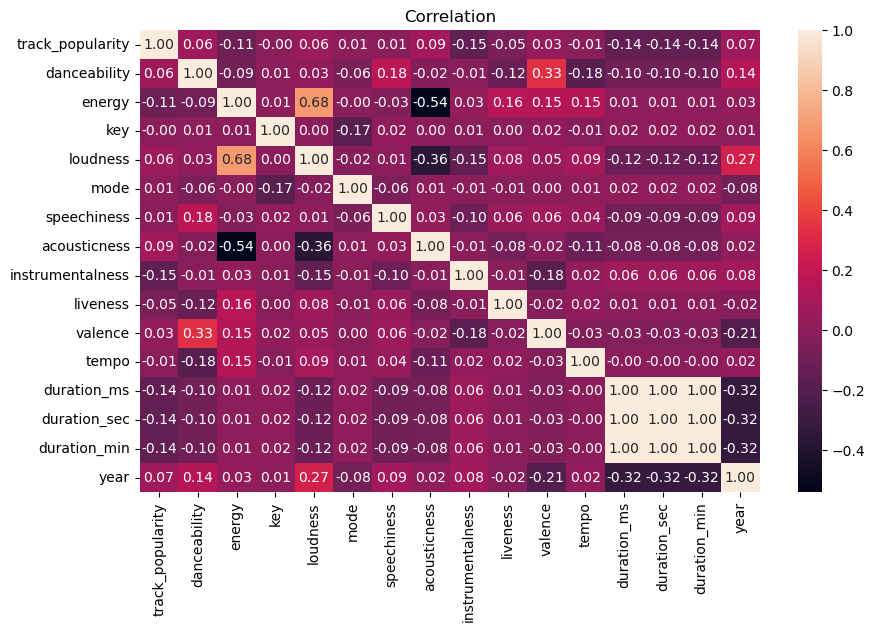

In [47]:
# find numeric columns and convert them to numeric types
num_columns = spotify.select_dtypes(include=["float64", "int64"])

plt.figure(figsize=(10, 6))
sns.heatmap(num_columns.corr(), annot=True, fmt=".2f")
plt.title("Correlation")
plt.show()


In [48]:
# sns.pairplot(spotify)
# plt.show()

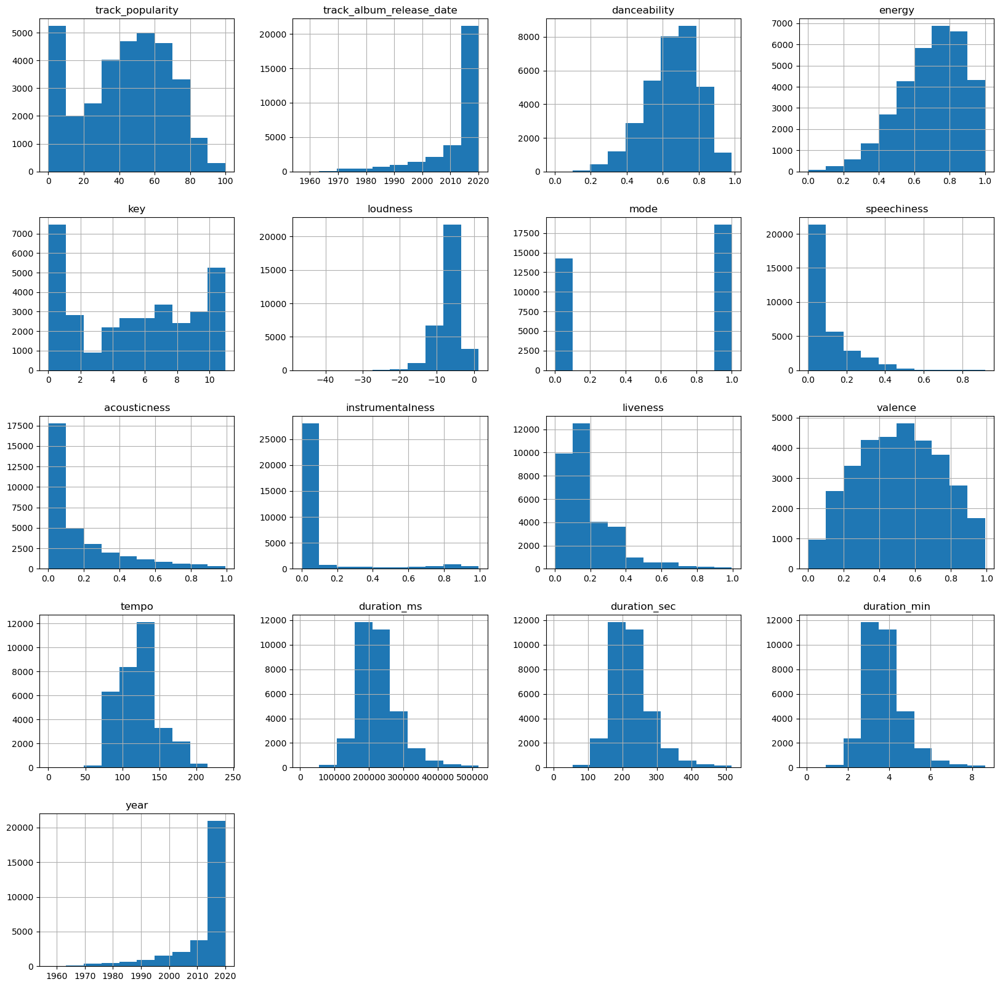

In [49]:
spotify.hist(figsize=(20,20))
plt.title("Histogram Plot",size=15,weight="bold")
plt.show()

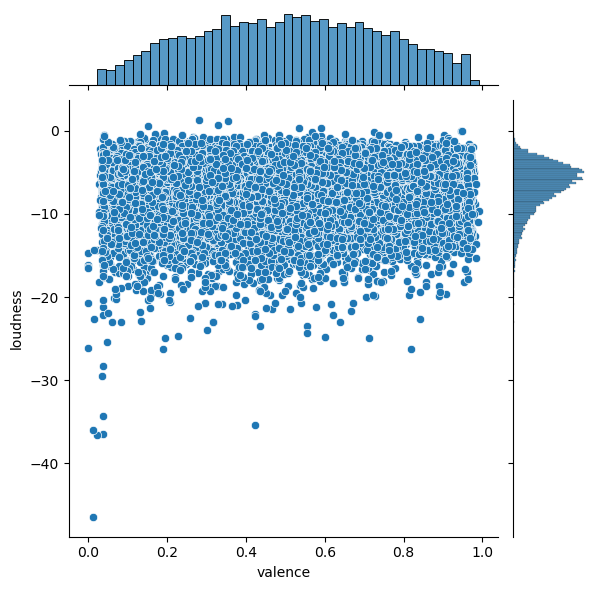

In [50]:
sns.jointplot(x="valence",y="loudness",data=spotify,kind="scatter")
plt.show()

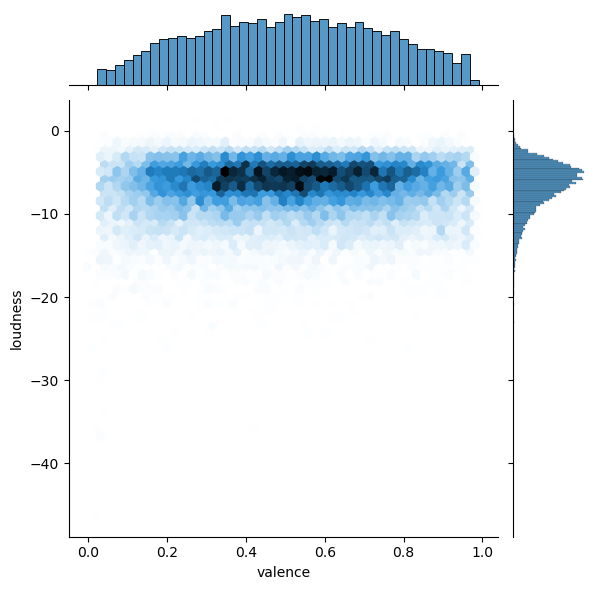

In [51]:
sns.jointplot(x="valence",y="loudness",data=spotify,kind="hex")
plt.show()

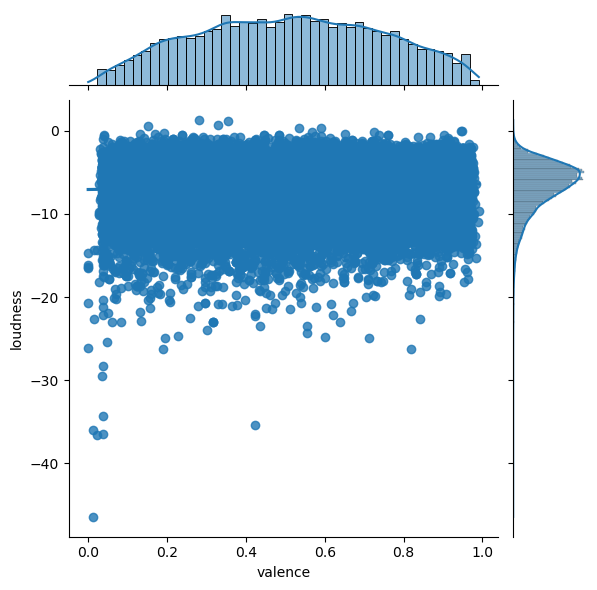

In [52]:
sns.jointplot(x="valence",y="loudness",data=spotify,kind="reg")
plt.show()

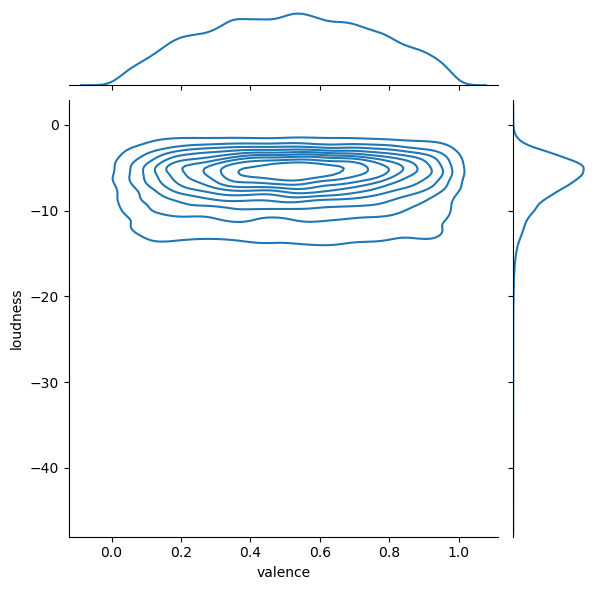

In [53]:
#kernel Density Estimate
sns.jointplot(x="valence",y="loudness",data=spotify,kind="kde")
plt.show()

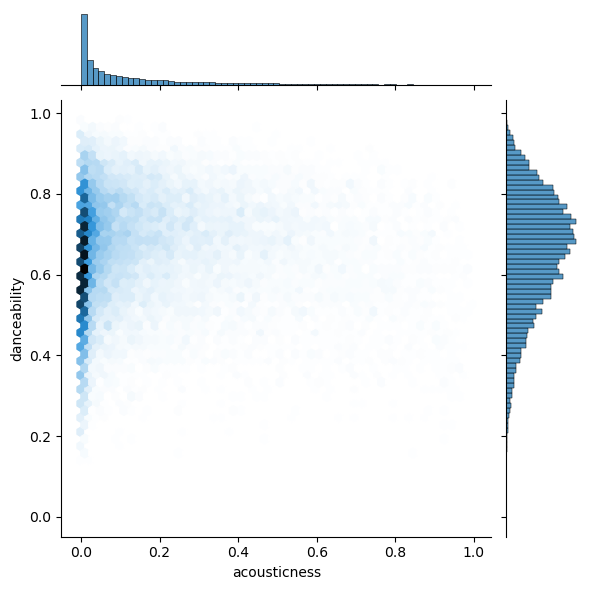

In [54]:
sns.jointplot(x="acousticness",y="danceability",data=spotify,kind="hex")
plt.show()

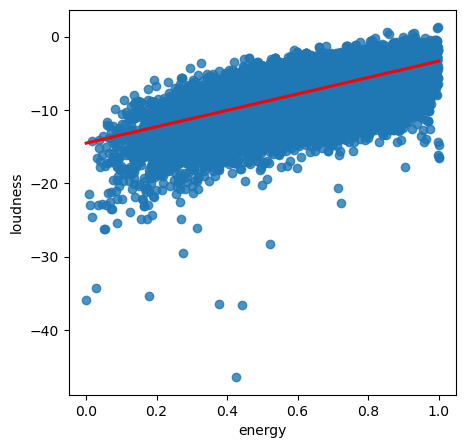

In [55]:
#relation between energy and loudness(db)
fig=plt.figure(figsize=(5,5))
sns.regplot(data=spotify,x="energy",y="loudness",line_kws={"color":"red"})
plt.show()

## Distribution of songs by year

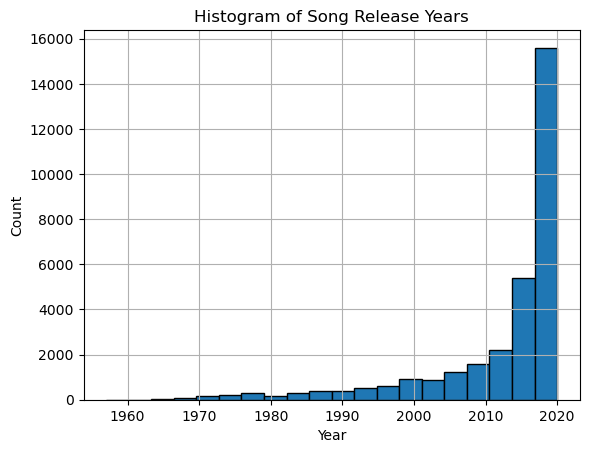

In [56]:
spotify["year"].hist(bins=20, edgecolor='black')
plt.xlabel('Year')
plt.ylabel('Count')
plt.title('Histogram of Song Release Years')
plt.show()

In [57]:

fig = px.histogram(spotify, x="year", nbins=20, title="Songs Released by Years",
                   labels={"year": "Year", "count": "Count"})
fig.update_layout(xaxis_title='Year', yaxis_title='Count')
fig.show()

## top 10 tracks

In [58]:

top_10_tracks=spotify.sort_values(by="track_popularity",ascending=False).head(10).reset_index(drop=True)
top_10_tracks.index=top_10_tracks.index+1
top_10_tracks

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,duration_sec,duration_min,year
1,2XU0oxnq2qxCpomAAuJY8K,Dance Monkey,Tones and I,100,0UywfDKYlyiu1b38DRrzYD,Dance Monkey (Stripped Back) / Dance Monkey,2019-10-17,Global Top 50 | 2020 Hits,1KNl4AYfgZtOVm9KHkhPTF,Latin,...,0.0924,0.69200,0.000104,0.1490,0.513,98.027,209438,209.438,3.490633,2019
2,2XU0oxnq2qxCpomAAuJY8K,Dance Monkey,Tones and I,100,0UywfDKYlyiu1b38DRrzYD,Dance Monkey (Stripped Back) / Dance Monkey,2019-10-17,"post-teen alternative, indie, pop (large variety)",1y42gwI5cuwjBslPyQNfqb,Pop,...,0.0924,0.69200,0.000104,0.1490,0.513,98.027,209438,209.438,3.490633,2019
3,696DnlkuDOXcMAnKlTgXXK,ROXANNE,Arizona Zervas,99,6HJDrXs0hpebaRFKA1sF90,ROXANNE,2019-10-10,Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Po...,3xMQTDLOIGvj3lWH5e5x6F,Edm,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,163.636,2.727267,2019
4,696DnlkuDOXcMAnKlTgXXK,ROXANNE,Arizona Zervas,99,6HJDrXs0hpebaRFKA1sF90,ROXANNE,2019-10-10,Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Po...,3xMQTDLOIGvj3lWH5e5x6F,R&b,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,163.636,2.727267,2019
5,696DnlkuDOXcMAnKlTgXXK,ROXANNE,Arizona Zervas,99,6HJDrXs0hpebaRFKA1sF90,ROXANNE,2019-10-10,Contemporary Urban,6wyJ4bsjZaUKa9f6GeZlAO,R&b,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,163.636,2.727267,2019
6,696DnlkuDOXcMAnKlTgXXK,ROXANNE,Arizona Zervas,99,6HJDrXs0hpebaRFKA1sF90,ROXANNE,2019-10-10,Global Top 50 | 2020 Hits,1KNl4AYfgZtOVm9KHkhPTF,Latin,...,0.1480,0.05220,0.000000,0.4600,0.457,116.735,163636,163.636,2.727267,2019
7,21jGcNKet2qwijlDFuPiPb,Circles,Post Malone,98,4g1ZRSobMefqF6nelkgibi,Hollywood's Bleeding,2019-09-06,Charts 2020 🔥Top 2020🔥Hits 2020🔥Summer 2020🔥Po...,3xMQTDLOIGvj3lWH5e5x6F,Edm,...,0.0395,0.19200,0.002440,0.0863,0.553,120.042,215280,215.280,3.588000,2019
8,0sf12qNH5qcw8qpgymFOqD,Blinding Lights,The Weeknd,98,2ZfHkwHuoAZrlz7RMj0PDz,Blinding Lights,2019-11-29,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,Latin,...,0.0629,0.00147,0.000209,0.0938,0.345,171.017,201573,201.573,3.359550,2019
9,21jGcNKet2qwijlDFuPiPb,Circles,Post Malone,98,4g1ZRSobMefqF6nelkgibi,Hollywood's Bleeding,2019-09-06,2020 Hits & 2019 Hits – Top Global Tracks 🔥🔥🔥,4JkkvMpVl4lSioqQjeAL0q,Latin,...,0.0395,0.19200,0.002440,0.0863,0.553,120.042,215280,215.280,3.588000,2019
10,7k4t7uLgtOxPwTpFmtJNTY,Tusa,KAROL G,98,7mKevNHhVnZER3BLgI8O4F,Tusa,2019-11-07,Urbano: Latino Vibes,0VsVywryrqLhHmsVFVcOAg,Latin,...,0.2980,0.29500,0.000134,0.0574,0.574,101.085,200960,200.960,3.349333,2019


In [59]:
fig=px.pie(top_10_tracks,values="track_popularity",names="track_name",hole=0.45)
fig.update_layout(title="Top 10 Tracks")
fig.update_traces(textfont_size=15,textinfo="percent")
fig.show()

## Tempo effect on popularity

In [60]:
fig=px.scatter(spotify,x="track_popularity",y="tempo")
fig.update_layout(legend_orientation="h",  
                  title="Tempo effect on popularity")
fig.show()

In [61]:
spotify.columns

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'duration_sec', 'duration_min', 'year'],
      dtype='object')

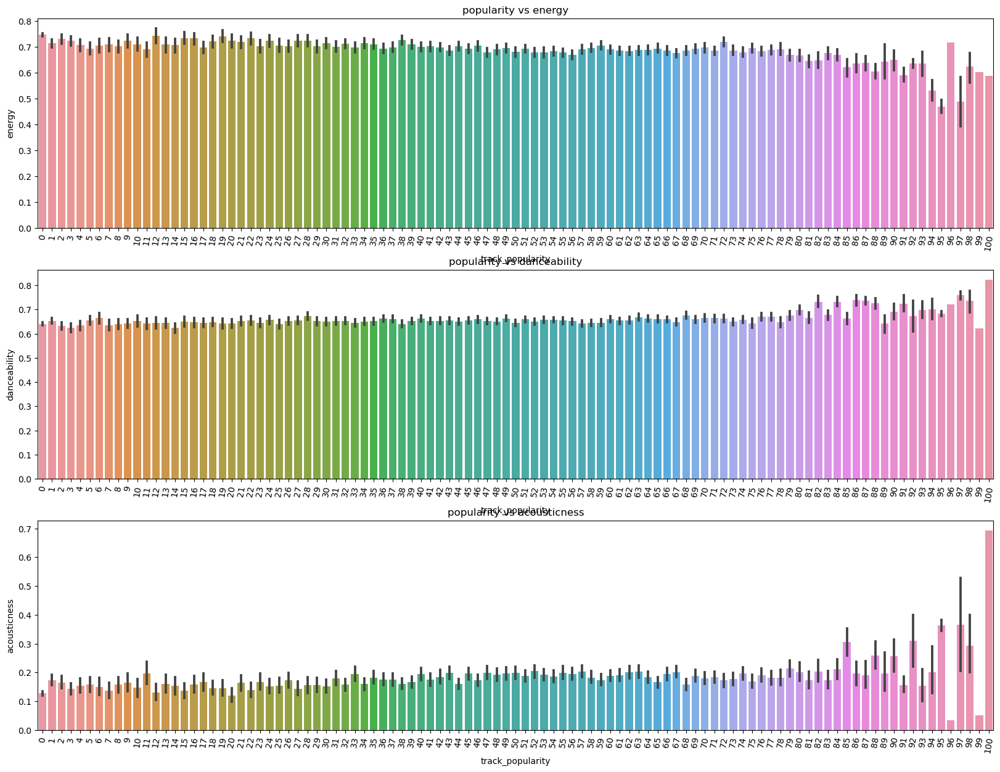

In [62]:

plt.figure(figsize=(20,15))
plt.subplot(3,1,1)
plt.xlabel("track_popularity")
plt.ylabel("energy")
plt.xticks(rotation=80)
plt.title("popularity vs energy")

sns.barplot(data=spotify,y="energy",x="track_popularity")
plt.subplot(3,1,2)
plt.xlabel("track_popularity")
plt.ylabel("danceability")
plt.xticks(rotation=80)
plt.title("popularity vs danceability")

sns.barplot(data=spotify,y="danceability",x="track_popularity")
plt.subplot(3,1,3)
plt.xlabel("popularity")
plt.ylabel("acoustics")
plt.title("popularity vs acousticness")
plt.xticks(rotation=80)
sns.barplot(data=spotify,y="acousticness",x="track_popularity")
plt.show()

In [63]:
import os
os.system("say 'Yeaheeeeee! Your script has finished.'")

0